# Moedling for Tree-Shape by CNN

In [1]:
import cv2
import numpy as np
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Model, save_model, load_model
from keras.layers import (Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D,
                                     Input, BatchNormalization, GlobalAveragePooling2D, concatenate)
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras.utils import plot_model
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from time import time, ctime
from random import randint
import os

Using TensorFlow backend.
c:\users\enos\appdata\local\programs\python\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\users\enos\appdata\local\programs\python\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\users\enos\appdata\local\programs\python\python36\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1

## Function

In [2]:
# prepare data, return data list and lable list
# c_max = 0 全抓; c_max > 0 依檔案修改時間正序取 c_max 個; c_max < 0 依檔案修改時間反序取 -c_max 個
def read_img(cats, paths, c_max=0, random_state=0): # Data preparation   
    X = []
    Y = []
    for i,c in enumerate(cats):
        ff = []
        lab = np.eye(len(cats))[i]
        ci = 0
        for p in paths:
            fs = glob(p + '/' + c + '/*.[jJ][pP][gG]') # image files may end with .jpg or .JPG
            if fs is not None:
                ff.extend(fs)
        ff = sorted(ff, key=os.path.getmtime)
        len_ff = len(ff)
        abs_cmax = abs(c_max)
        if c_max == 0 or abs_cmax > len_ff:
            sz = len_ff
        else:
            sz = abs_cmax
        if random_state > 0:
            np.random.seed(random_state)
            order = np.random.choice(len(ff), sz, replace=False)
        else:
            order = range(sz) if c_max >= 0 else range(len(ff)-1, len(ff)-1-sz, -1)
        for i in order:
            img_bgr = cv2.imread(ff[i])
            img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            img_resz = cv2.resize(img, (RES,RES))
            img_reshape = np.reshape(img_resz, (RES,RES,3)) /255.
            
            X.append(img_reshape)
            Y.append(lab)
            ci += 1
            if c_max > 0 and ci >= c_max:
                break
        print(f'{SPECIES[c]} {c}:\t{ci}')
    return np.array(X), np.array(Y)

def generator2(X1, X2, y, batch_size):
    genX1 = datagen.flow(X1, y, batch_size=batch_size, seed=42)
    genX2 = datagen.flow(X2, y, batch_size=batch_size, seed=42)
    while True:
        X1i = genX1.next()
        X2i = genX2.next()
        yield [X1i[0], X2i[0]], X1i[1]

def generator3(X1, X2, X3, y, batch_size):
    genX1 = datagen.flow(X1, y, batch_size=batch_size, seed=42)
    genX2 = datagen.flow(X2, y, batch_size=batch_size, seed=42)
    genX3 = datagen.flow(X3, y, batch_size=batch_size, seed=42)
    while True:
        X1i = genX1.next()
        X2i = genX2.next()
        X3i = genX3.next()
        yield [X1i[0], X2i[0], X3i[0]], X1i[1]

def plot_one(his, train, valid, step=5):
    his_train = []
    his_valid = []
    for x in his:
        his_train += x.history[train]
        his_valid += x.history[valid]
    plt.plot(his_train, label=train)
    plt.plot(his_valid, label=valid)
    plt.xticks(np.arange(0, len(train), step))
    plt.legend()
    plt.xlabel('epochs') #X軸文字
    plt.ylabel(train) #Y軸文字
    plt.grid() #劃格線

def plot_his(his):
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    plot_one(his, 'loss', 'val_loss')
    plt.subplot(1, 2, 2)
    plot_one(his, 'acc', 'val_acc')
    plt.show()

def evaluate(model, X, Y):
    loss, acc = model.evaluate(X, Y, verbose=0)
    print(f'accuracy: {acc:.4}, loss: {loss:.6}')
    pred = np.argmax(model.predict(X), axis=1)
    cm = confusion_matrix(np.argmax(Y, axis=1), pred)
    h = np.diag(cm) / np.sum(cm, axis=1)
    v = np.diag(cm) / np.sum(cm, axis=0)
    df = pd.DataFrame(cm, index=[f'[T]{SPECIES[x]}:{h[i]:.3}' for i, x in enumerate(CAT)],
                      columns=[f'[P]{SPECIES[x]}:{v[i]:.3}' for i, x in enumerate(CAT)])
    return df, pred

def Conv2d_BN(x, nb_filter,kernel_size, padding='same',strides=(1,1),name=None, batch_normalization=False):
    if name is not None:
        bn_name = name + '_bn'
        conv_name = name + '_conv'
    else:
        bn_name = None
        conv_name = None
 
    x = Conv2D(nb_filter,kernel_size,padding=padding,strides=strides,activation='relu',name=conv_name)(x)
    if batch_normalization:
        x = BatchNormalization(axis=3,name=bn_name)(x)
    return x

def Inception(x, nb_filter):
    branch1x1 = Conv2d_BN(x,nb_filter,(1,1), padding='same',strides=(1,1),name=None)
 
    branch3x3 = Conv2d_BN(x,nb_filter,(1,1), padding='same',strides=(1,1),name=None)
    branch3x3 = Conv2d_BN(branch3x3,nb_filter,(3,3), padding='same',strides=(1,1),name=None)
 
    branch5x5 = Conv2d_BN(x,nb_filter,(1,1), padding='same',strides=(1,1),name=None)
    branch5x5 = Conv2d_BN(branch5x5,nb_filter,(5,5), padding='same',strides=(1,1),name=None)
 
    branchpool = MaxPooling2D(pool_size=(3,3),strides=(1,1),padding='same')(x)
    branchpool = Conv2d_BN(branchpool,nb_filter,(1,1),padding='same',strides=(1,1),name=None)
 
    x = concatenate([branch1x1,branch3x3,branch5x5,branchpool],axis=3)
 
    return x

# Augumentation
datagen = ImageDataGenerator(
    rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180), 輕微讓樹幹傾斜
    width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False,  # randomly flip images, 取消垂直翻轉
    zoom_range=0.5,
    fill_mode='constant', # shift 後補 0 (cval)
    cval=0)

## Configuration

In [3]:
SPECIES = {'TM':'小葉欖仁', 'DR':'鳳凰木', 'BP':'構樹', 'LF':'楓香', 'FM':'榕樹', 'PI':'印度紫檀', 'TC':'大葉欖仁',
           'PC':'阿勃勒', 'BJ':'茄苳', 'PP':'盾柱木', 'AE':'青楓', 'MI':'白千層', 'KE':'臺灣欒樹', 'CO':'土肉桂',
           'AS':'黑板樹', 'FE':'印度橡膠樹', 'FF':'水同木', 'FS':'雀榕', 'MA':'苦楝', 'RR':'大王椰子', 'MP':'水黃皮',
           'LL':'大花紫薇', 'FR':'菩提', 'BU':'洋紫荊', 'BB':'艷紫荊', 'BB':'羊蹄甲', 'FG':'光臘樹', 'SS':'烏臼', 'FB':'垂榕',
           'FP':'稜果榕', 'CC':'樟樹', 'CB':'陰香', 'PF':'大葉山欖'}
CAT = ['FM', 'MI', 'LF', 'KE', 'TM', 'TC', 'BJ', 'AS', 'RR', 'DR', 'PC', 'MP', 'CC', 'MA']
RES = 448
CA1_RATE = 2/3.
CA2_RATE = 1/2.
CA1_RES_F = int(RES*(1-CA1_RATE)/2)
CA2_RES_F = int(RES*(1-CA2_RATE)/2) 
print(f'{len(CAT)} categories are as below: {[(x, SPECIES[x]) for x in CAT]}')

14 categories are as below: [('FM', '榕樹'), ('MI', '白千層'), ('LF', '楓香'), ('KE', '臺灣欒樹'), ('TM', '小葉欖仁'), ('TC', '大葉欖仁'), ('BJ', '茄苳'), ('AS', '黑板樹'), ('RR', '大王椰子'), ('DR', '鳳凰木'), ('PC', '阿勃勒'), ('MP', '水黃皮'), ('CC', '樟樹'), ('MA', '苦楝')]


## Load training data

In [4]:
VALIDATION = False
TRAIN_PATH = ['E:/wtit/data/wtit-20191122-448/train/tree']
TRAIN_CATSZ_MAX = 100

start = time()
X_train_, Y_train_ = read_img(CAT, TRAIN_PATH, -TRAIN_CATSZ_MAX)
if VALIDATION:
    X_train_ca1_ = X_train_[:, CA1_RES_F:RES-CA1_RES_F, CA1_RES_F:RES-CA1_RES_F]
    X_train_ca2_ = X_train_[:, CA2_RES_F:RES-CA2_RES_F, CA2_RES_F:RES-CA2_RES_F]
    X_train, X_valid, X_train_ca1, X_valid_ca1, X_train_ca2, X_valid_ca2, Y_train, Y_valid = \
        train_test_split(X_train_, X_train_ca1_, X_train_ca2_, Y_train_, test_size=0.2, random_state=42)
else:
    X_train, Y_train = shuffle(X_train_, Y_train_, random_state=42)
    X_train_ca1 = X_train[:, CA1_RES_F:RES-CA1_RES_F, CA1_RES_F:RES-CA1_RES_F]
    X_train_ca2 = X_train[:, CA2_RES_F:RES-CA2_RES_F, CA2_RES_F:RES-CA2_RES_F]
print(f'[{len(X_train_)}] training data loaded for {time()-start:.2f} secs')

榕樹 FM:	100
白千層 MI:	100
楓香 LF:	100
臺灣欒樹 KE:	100
小葉欖仁 TM:	100
大葉欖仁 TC:	62
茄苳 BJ:	100
黑板樹 AS:	96
大王椰子 RR:	68
鳳凰木 DR:	100
阿勃勒 PC:	100
水黃皮 MP:	68
樟樹 CC:	100
苦楝 MA:	56
[1250] training data loaded for 15.63 secs


## Show training data

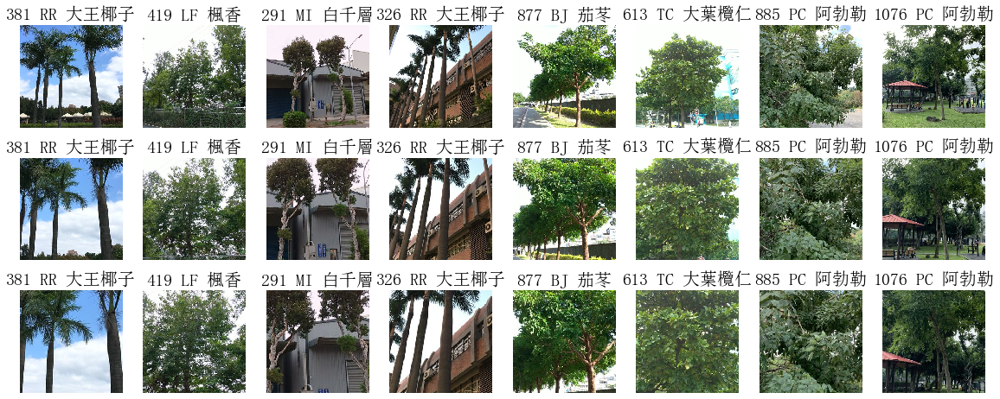

In [5]:
plt.subplots(figsize=(20,8))
W = 8 # sample size, only a row
DRAW_X = [X_train, X_train_ca1, X_train_ca2] # target vector for plot
DRAW_Y = Y_train
for i in range(W):
    idx = randint(0, len(DRAW_X[0])-1)
    cat = CAT[np.argmax(DRAW_Y[idx])]
    t = f'{idx} {cat} {SPECIES[cat]}'
    for j, d in enumerate(DRAW_X):
        plt.subplot(3, W, i+(j*W)+1)
        plt.axis('off')
        plt.title(t, fontproperties='SimSun', fontsize=20)
        plt.imshow(d[idx])

## Load testing data

In [6]:
start = time()
TEST_PATH = ['E:/wtit/data/wtit-20191122-448/test/tree']
X_test, Y_test = read_img(CAT, TEST_PATH, 25)
X_test_ca1 = X_test[:, CA1_RES_F:RES-CA1_RES_F, CA1_RES_F:RES-CA1_RES_F]
X_test_ca2 = X_test[:, CA2_RES_F:RES-CA2_RES_F, CA2_RES_F:RES-CA2_RES_F]
print(f'[{len(X_test)}] test data loaded for {time()-start:.2f} secs')

榕樹 FM:	25
白千層 MI:	25
楓香 LF:	25
臺灣欒樹 KE:	25
小葉欖仁 TM:	25
大葉欖仁 TC:	25
茄苳 BJ:	25
黑板樹 AS:	25
大王椰子 RR:	25
鳳凰木 DR:	25
阿勃勒 PC:	25
水黃皮 MP:	25
樟樹 CC:	25
苦楝 MA:	25
[350] test data loaded for 3.09 secs


## Show testing data

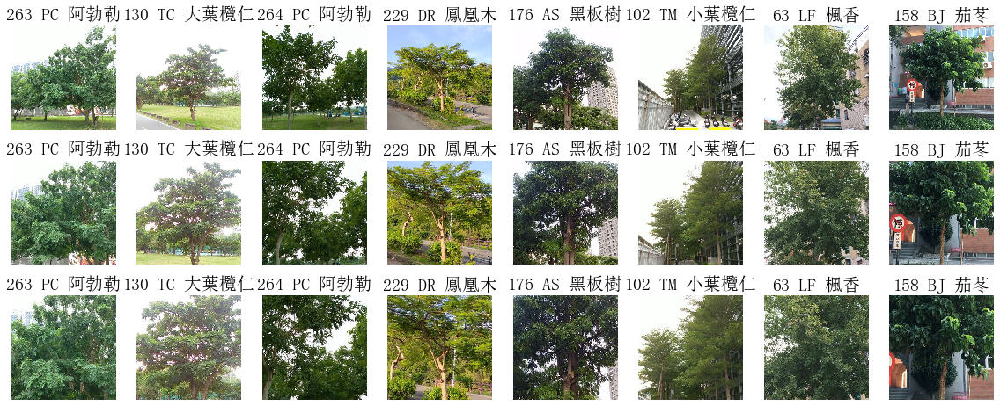

In [7]:
plt.subplots(figsize=(20,8))
W = 8 # sample size, only a row
DRAW_X = [X_test, X_test_ca1, X_test_ca2] # target vector for plot
DRAW_Y = Y_test
for i in range(W):
    idx = randint(0, len(DRAW_X[0])-1)
    cat = CAT[np.argmax(DRAW_Y[idx])]
    t = f'{idx} {cat} {SPECIES[cat]}'
    for j, d in enumerate(DRAW_X):
        plt.subplot(3, W, i+(j*W)+1)
        plt.axis('off')
        plt.title(t, fontproperties='SimSun', fontsize=20)
        plt.imshow(d[idx])

## Model design - STD

In [9]:
in_std = Input(shape=(RES,RES,3))
x = Conv2D(filters=24, kernel_size=(3,3), activation='selu', padding='same')(in_std)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=48, kernel_size=(3,3), activation='selu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=48, kernel_size=(3,3), activation='selu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=48, kernel_size=(3,3), activation='selu', padding='same')(x)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(2048, activation='selu')(x)
x = Dropout(0.3)(x)
outputs = Dense(len(CAT), activation='softmax')(x)

model = Model(inputs=[in_std], outputs=outputs)
model.summary()

# Model configuration
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
his = []

Instructions for updating:
Colocations handled automatically by placer.
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 448, 448, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 448, 448, 24)      672       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 224, 224, 24)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 224, 224, 48)      10416     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 112, 112, 48)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 112, 112, 48)      20784     
_____________________________________________________

In [ ]:
checkpoint = ModelCheckpoint('model_tree_448_20191125/wtit-tree-cnn-ep{epoch:03d}-acc{val_acc:.3f}.h5', monitor='val_acc',
                             save_weights_only=False, save_best_only=False, period=1, verbose=0)

model_history = model.fit_generator(datagen.flow(X_train, Y_train, batch_size=16, seed=42),
                                    steps_per_epoch=200, epochs=600, callbacks=[checkpoint],
                                    validation_data=(X_test, Y_test), verbose=1)

his.append(model_history)
plot_his(his)

Instructions for updating:
Use tf.cast instead.
Epoch 1/600
200/200 [==============================] - 101s 507ms/step - loss: 2.7207 - acc: 0.1279 - val_loss: 5.2980 - val_acc: 0.0714
Epoch 2/600
200/200 [==============================] - 94s 470ms/step - loss: 2.5935 - acc: 0.1368 - val_loss: 4.0894 - val_acc: 0.0743
Epoch 3/600
200/200 [==============================] - 105s 525ms/step - loss: 2.5019 - acc: 0.1671 - val_loss: 3.4850 - val_acc: 0.1314
Epoch 4/600
200/200 [==============================] - 97s 484ms/step - loss: 2.5052 - acc: 0.1638 - val_loss: 4.6200 - val_acc: 0.1371
Epoch 5/600
200/200 [==============================] - 101s 504ms/step - loss: 2.4510 - acc: 0.1949 - val_loss: 4.3075 - val_acc: 0.1229
Epoch 6/600
200/200 [==============================] - 99s 497ms/step - loss: 2.4331 - acc: 0.1924 - val_loss: 3.1880 - val_acc: 0.1143
Epoch 7/600
200/200 [==============================] - 101s 506ms/step - loss: 2.3693 - acc: 0.2081 - val_loss: 3.5919 - val_acc: 0.1

200/200 [==============================] - 103s 513ms/step - loss: 0.8336 - acc: 0.7229 - val_loss: 7.3222 - val_acc: 0.3086
Epoch 118/600
200/200 [==============================] - 105s 527ms/step - loss: 0.8450 - acc: 0.7336 - val_loss: 1.9741 - val_acc: 0.5657
Epoch 119/600
200/200 [==============================] - 104s 520ms/step - loss: 0.7576 - acc: 0.7533 - val_loss: 3.0625 - val_acc: 0.4829
Epoch 120/600
200/200 [==============================] - 102s 512ms/step - loss: 0.7601 - acc: 0.7508 - val_loss: 2.5426 - val_acc: 0.5029
Epoch 121/600
200/200 [==============================] - 105s 523ms/step - loss: 0.6793 - acc: 0.7755 - val_loss: 2.6941 - val_acc: 0.5171
Epoch 122/600
200/200 [==============================] - 103s 517ms/step - loss: 0.7519 - acc: 0.7533 - val_loss: 1.9907 - val_acc: 0.5371
Epoch 123/600
200/200 [==============================] - 103s 513ms/step - loss: 0.7033 - acc: 0.7825 - val_loss: 2.8910 - val_acc: 0.4829
Epoch 124/600
200/200 [==================

200/200 [==============================] - 104s 521ms/step - loss: 0.6286 - acc: 0.8014 - val_loss: 2.0466 - val_acc: 0.6086
Epoch 177/600
200/200 [==============================] - 103s 516ms/step - loss: 0.5064 - acc: 0.8296 - val_loss: 2.2037 - val_acc: 0.5743
Epoch 178/600
200/200 [==============================] - 103s 516ms/step - loss: 0.7690 - acc: 0.7736 - val_loss: 2.2256 - val_acc: 0.5600
Epoch 179/600
200/200 [==============================] - 102s 512ms/step - loss: 0.5476 - acc: 0.8298 - val_loss: 3.7683 - val_acc: 0.4514
Epoch 180/600
200/200 [==============================] - 104s 520ms/step - loss: 0.5329 - acc: 0.8172 - val_loss: 1.6194 - val_acc: 0.6686
Epoch 181/600
200/200 [==============================] - 101s 503ms/step - loss: 0.5149 - acc: 0.8298 - val_loss: 2.1330 - val_acc: 0.5857
Epoch 182/600
200/200 [==============================] - 103s 517ms/step - loss: 0.5637 - acc: 0.8279 - val_loss: 2.0118 - val_acc: 0.5686
Epoch 183/600
200/200 [==================

In [10]:
cm, Y_pred = evaluate(model, X_test, Y_test)
cm

accuracy: 0.6171, loss: 2.05495


,[P]榕樹:0.385,[P]白千層:0.561,[P]楓香:0.833,[P]臺灣欒樹:0.818,[P]小葉欖仁:0.81,[P]大葉欖仁:1.0,[P]茄苳:0.556,[P]黑板樹:0.407,[P]大王椰子:1.0,[P]鳳凰木:0.765,[P]阿勃勒:0.543,[P]水黃皮:0.625,[P]樟樹:0.619,[P]苦楝:0.786
[T]榕樹:0.8,20,2,1,0,0,0,0,1,0,0,0,1,0,0
[T]白千層:0.92,1,23,0,0,0,0,0,1,0,0,0,0,0,0
[T]楓香:0.6,0,1,15,0,2,0,0,3,0,0,1,1,2,0
[T]臺灣欒樹:0.72,2,1,0,18,0,0,0,1,0,0,1,0,1,1
[T]小葉欖仁:0.68,5,1,0,0,17,0,0,2,0,0,0,0,0,0
[T]大葉欖仁:0.48,5,1,0,0,0,12,0,1,0,0,6,0,0,0
[T]茄苳:0.2,5,1,1,0,0,0,5,8,0,1,0,1,2,1
[T]黑板樹:0.88,1,0,0,0,0,0,0,22,0,1,1,0,0,0
[T]大王椰子:0.72,0,2,0,0,1,0,0,3,18,0,1,0,0,0
[T]鳳凰木:0.52,3,0,0,3,0,0,1,1,0,13,0,3,0,1


In [38]:
#save_model(model, 'wtit-tree-CACNN-std+1-tf2-cat4-tf2-ep30-0.55.h5', save_format='h5')

In [ ]:
model_chk = load_model('model/wtit-tree-plus263-ep240-acc0.743.h5')
cm, Y_pred = evaluate(model_chk, X_test, Y_test)
cm

In [10]:
model = load_model('model_tree_448_20191125/wtit-tree-cnn-ep263-acc0.646.h5')
his = []

Epoch 1/337
200/200 [==============================] - 95s 473ms/step - loss: 0.6474 - acc: 0.7989 - val_loss: 2.0856 - val_acc: 0.5943
Epoch 2/337
200/200 [==============================] - 97s 485ms/step - loss: 0.5413 - acc: 0.8274 - val_loss: 2.5092 - val_acc: 0.5457
Epoch 3/337
200/200 [==============================] - 102s 508ms/step - loss: 0.4620 - acc: 0.8455 - val_loss: 1.6657 - val_acc: 0.6429
Epoch 4/337
200/200 [==============================] - 92s 460ms/step - loss: 0.4475 - acc: 0.8629 - val_loss: 5.2274 - val_acc: 0.3543
Epoch 5/337
200/200 [==============================] - 95s 475ms/step - loss: 0.5270 - acc: 0.8387 - val_loss: 1.8291 - val_acc: 0.6314
Epoch 6/337
200/200 [==============================] - 94s 471ms/step - loss: 0.4808 - acc: 0.8569 - val_loss: 1.8750 - val_acc: 0.6171
Epoch 7/337
200/200 [==============================] - 94s 468ms/step - loss: 0.4795 - acc: 0.8550 - val_loss: 1.9403 - val_acc: 0.6371
Epoch 8/337
200/200 [==========================

200/200 [==============================] - 99s 496ms/step - loss: 0.4278 - acc: 0.8623 - val_loss: 2.0236 - val_acc: 0.6486
Epoch 61/337
200/200 [==============================] - 100s 498ms/step - loss: 0.3679 - acc: 0.8778 - val_loss: 1.4842 - val_acc: 0.6629
Epoch 62/337
200/200 [==============================] - 102s 508ms/step - loss: 0.3644 - acc: 0.8814 - val_loss: 1.7467 - val_acc: 0.6600
Epoch 63/337
200/200 [==============================] - 106s 532ms/step - loss: 0.4393 - acc: 0.8651 - val_loss: 2.5666 - val_acc: 0.5400
Epoch 64/337
200/200 [==============================] - 102s 512ms/step - loss: 0.3701 - acc: 0.8840 - val_loss: 2.8484 - val_acc: 0.5629
Epoch 65/337
200/200 [==============================] - 102s 509ms/step - loss: 0.4735 - acc: 0.8503 - val_loss: 2.1887 - val_acc: 0.5943
Epoch 66/337
200/200 [==============================] - 97s 485ms/step - loss: 0.4786 - acc: 0.8509 - val_loss: 1.9411 - val_acc: 0.6114
Epoch 67/337
200/200 [===========================

200/200 [==============================] - 103s 515ms/step - loss: 0.3674 - acc: 0.8799 - val_loss: 1.9788 - val_acc: 0.6543
Epoch 120/337
200/200 [==============================] - 109s 547ms/step - loss: 0.3621 - acc: 0.8790 - val_loss: 1.9035 - val_acc: 0.6429
Epoch 121/337
200/200 [==============================] - 107s 535ms/step - loss: 0.3886 - acc: 0.8723 - val_loss: 2.2585 - val_acc: 0.6057
Epoch 122/337
200/200 [==============================] - 106s 529ms/step - loss: 0.3546 - acc: 0.9006 - val_loss: 1.7024 - val_acc: 0.6600
Epoch 123/337
200/200 [==============================] - 107s 535ms/step - loss: 0.4638 - acc: 0.8600 - val_loss: 3.3923 - val_acc: 0.5057
Epoch 124/337
200/200 [==============================] - 105s 524ms/step - loss: 0.3456 - acc: 0.8828 - val_loss: 1.9788 - val_acc: 0.6486
Epoch 125/337
200/200 [==============================] - 108s 538ms/step - loss: 0.5139 - acc: 0.8493 - val_loss: 4.0728 - val_acc: 0.4257
Epoch 126/337
200/200 [==================

200/200 [==============================] - 104s 518ms/step - loss: 0.4171 - acc: 0.8718 - val_loss: 2.3492 - val_acc: 0.5686
Epoch 179/337
200/200 [==============================] - 107s 535ms/step - loss: 0.3908 - acc: 0.8755 - val_loss: 1.5827 - val_acc: 0.6486
Epoch 180/337
200/200 [==============================] - 100s 500ms/step - loss: 0.3800 - acc: 0.8819 - val_loss: 1.7071 - val_acc: 0.6629
Epoch 181/337
200/200 [==============================] - 97s 485ms/step - loss: 0.3955 - acc: 0.8796 - val_loss: 2.2800 - val_acc: 0.6086
Epoch 182/337
200/200 [==============================] - 103s 517ms/step - loss: 0.3571 - acc: 0.8928 - val_loss: 1.9926 - val_acc: 0.6143
Epoch 183/337
200/200 [==============================] - 101s 504ms/step - loss: 0.3951 - acc: 0.8865 - val_loss: 1.6934 - val_acc: 0.6771
Epoch 184/337
200/200 [==============================] - 102s 509ms/step - loss: 0.3008 - acc: 0.9023 - val_loss: 1.8053 - val_acc: 0.6686
Epoch 185/337
200/200 [===================

200/200 [==============================] - 106s 529ms/step - loss: 0.4051 - acc: 0.8764 - val_loss: 1.6213 - val_acc: 0.7057
Epoch 238/337
200/200 [==============================] - 107s 536ms/step - loss: 0.3152 - acc: 0.8916 - val_loss: 1.3629 - val_acc: 0.7029
Epoch 239/337
200/200 [==============================] - 107s 535ms/step - loss: 0.3199 - acc: 0.8993 - val_loss: 1.5676 - val_acc: 0.6629
Epoch 240/337
200/200 [==============================] - 106s 532ms/step - loss: 0.3040 - acc: 0.9038 - val_loss: 1.3094 - val_acc: 0.7429
Epoch 241/337
200/200 [==============================] - 106s 530ms/step - loss: 0.3613 - acc: 0.8992 - val_loss: 2.5294 - val_acc: 0.5429
Epoch 242/337
200/200 [==============================] - 108s 539ms/step - loss: 0.4151 - acc: 0.8711 - val_loss: 1.9235 - val_acc: 0.6571
Epoch 243/337
200/200 [==============================] - 106s 532ms/step - loss: 0.3798 - acc: 0.8824 - val_loss: 2.1989 - val_acc: 0.5857
Epoch 244/337
200/200 [==================

200/200 [==============================] - 105s 526ms/step - loss: 0.3812 - acc: 0.8928 - val_loss: 2.0135 - val_acc: 0.6486
Epoch 297/337
200/200 [==============================] - 106s 528ms/step - loss: 0.3552 - acc: 0.8863 - val_loss: 3.9561 - val_acc: 0.3857
Epoch 298/337
200/200 [==============================] - 106s 532ms/step - loss: 0.4214 - acc: 0.8682 - val_loss: 1.8840 - val_acc: 0.6200
Epoch 299/337
200/200 [==============================] - 106s 532ms/step - loss: 0.3385 - acc: 0.8933 - val_loss: 2.1863 - val_acc: 0.6029
Epoch 300/337
200/200 [==============================] - 108s 541ms/step - loss: 0.3890 - acc: 0.8793 - val_loss: 1.9672 - val_acc: 0.6314
Epoch 301/337
200/200 [==============================] - 105s 525ms/step - loss: 0.3376 - acc: 0.8984 - val_loss: 2.1425 - val_acc: 0.6314
Epoch 302/337
200/200 [==============================] - 108s 538ms/step - loss: 0.3145 - acc: 0.9025 - val_loss: 1.5954 - val_acc: 0.7086
Epoch 303/337
200/200 [==================

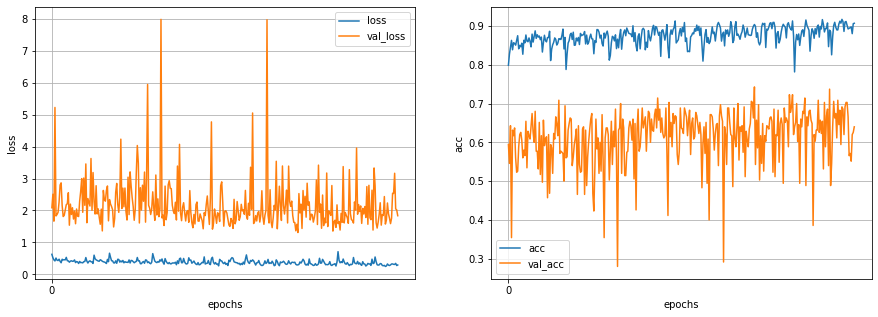

In [11]:
checkpoint = ModelCheckpoint('model_tree_448_20191125/wtit-tree-plus263-ep{epoch:03d}-acc{val_acc:.3f}.h5', monitor='val_acc',
                             save_weights_only=False, save_best_only=False, period=1, verbose=0)

model_history = model.fit_generator(datagen.flow(X_train, Y_train, batch_size=16, seed=42),
                                    steps_per_epoch=200, epochs=600-263, callbacks=[checkpoint],
                                    validation_data=(X_test, Y_test), verbose=1)

his.append(model_history)
plot_his(his)

## Model design - CA2

In [13]:
in_ca2 = Input(shape=(int(RES*CA2_RATE),int(RES*CA2_RATE),3))
x = Conv2D(filters=24, kernel_size=(3,3), activation='relu', padding='same')(in_ca2)
x = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(x)
x = Conv2D(filters=96, kernel_size=(3,3), activation='relu', padding='same')(x)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(len(CAT), activation='softmax')(x)

model = Model(inputs=[in_ca2], outputs=outputs)
model.summary()

# Model configuration
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
his = []

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 168, 168, 3)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 168, 168, 24)      672       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 168, 168, 48)      10416     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 84, 84, 48)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 84, 84, 48)        20784     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 84, 84, 96)        41568     
_________________________________________________________________
global_average_pooling2d_2 ( (None, 96)                0         
__________

Epoch 1/30
14/14 [==============================] - 5s 347ms/step - loss: 1.8954 - acc: 0.2393 - val_loss: 1.9512 - val_acc: 0.1429
Epoch 2/30
14/14 [==============================] - 2s 133ms/step - loss: 1.8375 - acc: 0.2411 - val_loss: 1.9601 - val_acc: 0.1643
Epoch 3/30
14/14 [==============================] - 3s 179ms/step - loss: 1.7994 - acc: 0.2500 - val_loss: 1.9484 - val_acc: 0.1429
Epoch 4/30
14/14 [==============================] - 3s 181ms/step - loss: 1.8248 - acc: 0.2571 - val_loss: 1.9756 - val_acc: 0.1571
Epoch 5/30
14/14 [==============================] - 3s 181ms/step - loss: 1.7996 - acc: 0.2661 - val_loss: 1.9585 - val_acc: 0.2286
Epoch 6/30
14/14 [==============================] - 3s 179ms/step - loss: 1.7716 - acc: 0.3000 - val_loss: 1.9855 - val_acc: 0.1429
Epoch 7/30
14/14 [==============================] - 3s 181ms/step - loss: 1.7529 - acc: 0.3107 - val_loss: 1.9330 - val_acc: 0.2000
Epoch 8/30
14/14 [==============================] - 2s 177ms/step - loss: 1.

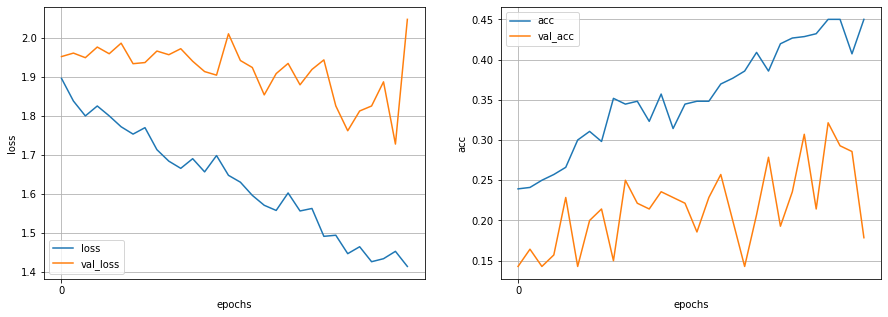

In [14]:
checkpoint = ModelCheckpoint('model_ca2/wtit-tree-cnn-ca2-cat7-ep{epoch:03d}-valacc{val_acc:.3f}.h5', monitor='val_acc',
                             save_weights_only=False, save_best_only=False, period=1, verbose=0)
# TF2 version
model_history = model.fit_generator(datagen.flow(X_train_ca2, Y_train, batch_size=40, seed=42),
                                    steps_per_epoch=80, epochs=30, callbacks=[checkpoint],
                                    validation_data=(X_test_ca2, Y_test), verbose=1)

# TF1 version
#model_history = model.fit_generator(datagen.flow(X_train, Y_train, batch_size=40, seed=42),
#                                    samples_per_epoch=6000, epochs=30, callbacks=[checkpoint],
#                                    validation_data=(X_valid, Y_valid))

his.append(model_history)
plot_his(his)

In [ ]:
cm, Y_pred = evaluate(model, X_test_ca2, Y_test)
cm

accuracy: 0.1786, loss: 2.00296


In [65]:
#save_model(model, 'wtit-tree-CACNN-stdct2-cat7-tf2-ep30-0.63.h5', save_format='h5')

In [15]:
model_chk = load_model('model/wtit-tree-cnn-sample2-cat7-ep028-valacc0.372.h5')
cm, Y_pred = evaluate(model_chk, X_test, Y_test)
cm

accuracy: 0.4357, loss: 2.71778


,[P]小葉欖仁:0.333,[P]榕樹:0.364,[P]臺灣欒樹:0.727,[P]樟樹:0.438,[P]茄苳:0.6,[P]楓香:0.424,[P]白千層:0.417
[T]小葉欖仁:0.1,2,4,0,3,0,7,4
[T]榕樹:0.6,1,12,1,2,0,0,4
[T]臺灣欒樹:0.4,2,2,8,0,0,3,5
[T]樟樹:0.35,1,4,1,7,1,2,4
[T]茄苳:0.15,0,6,0,3,3,7,1
[T]楓香:0.7,0,1,1,1,0,14,3
[T]白千層:0.75,0,4,0,0,1,0,15


## Model design - STD + Central Attention 1/2 + Central Attention 2/3

In [52]:
in_std = Input(shape=(RES,RES,3))
x = Conv2D(filters=24, kernel_size=(3,3), activation='relu', padding='same')(in_std)
x = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(x)
x = Conv2D(filters=96, kernel_size=(3,3), activation='relu', padding='same')(x)
x = GlobalAveragePooling2D()(x)

in_ca1 = Input(shape=(int(RES*CA1_RATE),int(RES*CA1_RATE),3))
y = Conv2D(filters=24, kernel_size=(3,3), activation='relu', padding='same')(in_ca1)
y = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(y)
y = MaxPooling2D(pool_size=(2, 2))(y)
y = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(y)
y = Conv2D(filters=96, kernel_size=(3,3), activation='relu', padding='same')(y)
y = GlobalAveragePooling2D()(y)

in_ca2 = Input(shape=(int(RES*CA2_RATE),int(RES*CA2_RATE),3))
w = Conv2D(filters=24, kernel_size=(3,3), activation='relu', padding='same')(in_ca2)
w = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(w)
w = MaxPooling2D(pool_size=(2, 2))(w)
w = Conv2D(filters=48, kernel_size=(3,3), activation='relu', padding='same')(w)
w = Conv2D(filters=96, kernel_size=(3,3), activation='relu', padding='same')(w)
w = GlobalAveragePooling2D()(w)

z = K.concatenate([x, y, w])
z = BatchNormalization()(z)
z = Dense(2048, activation='relu')(z)
z = Dropout(0.5)(z)
outputs = Dense(len(CAT), activation='softmax')(z)

model = Model(inputs=[in_std, in_ca1, in_ca2], outputs=outputs)
model.summary()

# Model configuration
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
his = []

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 336, 336, 3) 0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 168, 168, 3) 0                                            
__________________________________________________________________________________________________
conv2d_24 (Conv2D)              (None, 336, 336, 24) 672         input_7[0][0]                    
____________________________________________________________________________________________

Epoch 1/30
50/50 [==============================] - 71s 1s/step - loss: 1.8462 - acc: 0.2470 - val_loss: 1.9430 - val_acc: 0.1429
Epoch 2/30
50/50 [==============================] - 74s 1s/step - loss: 1.7868 - acc: 0.2920 - val_loss: 1.9573 - val_acc: 0.1357
Epoch 3/30
50/50 [==============================] - 70s 1s/step - loss: 1.6704 - acc: 0.3390 - val_loss: 1.9368 - val_acc: 0.1857
Epoch 4/30
50/50 [==============================] - 70s 1s/step - loss: 1.6470 - acc: 0.3565 - val_loss: 1.9530 - val_acc: 0.1357
Epoch 5/30
50/50 [==============================] - 72s 1s/step - loss: 1.5716 - acc: 0.3935 - val_loss: 1.9123 - val_acc: 0.1500
Epoch 6/30
50/50 [==============================] - 77s 2s/step - loss: 1.4646 - acc: 0.4455 - val_loss: 1.8498 - val_acc: 0.2286
Epoch 7/30
50/50 [==============================] - 76s 2s/step - loss: 1.4337 - acc: 0.4440 - val_loss: 1.9635 - val_acc: 0.1929
Epoch 8/30
50/50 [==============================] - 71s 1s/step - loss: 1.3729 - acc: 0.48

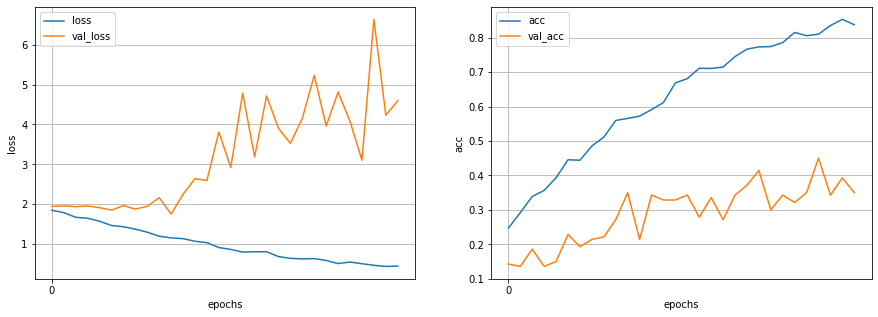

In [53]:
checkpoint = ModelCheckpoint('model/wtit-tree-stdca1ca2-cat7-ep{epoch:03d}-valacc{val_acc:.3f}.h5', monitor='val_acc',
                             save_weights_only=False, save_best_only=True, period=1, verbose=0)
model_history = model.fit_generator(generator3(X_train, X_train_ca1, X_train_ca2, Y_train, batch_size=40),
                                    steps_per_epoch=50, epochs=30, callbacks=[checkpoint],
                                    validation_data=([X_valid, X_valid_ca1, X_valid_ca2], Y_valid))
his.append(model_history)
plot_his(his)

In [55]:
cm, Y_pred = evaluate(model, [X_test, X_test_ca1, X_test_ca2], Y_test)
cm

accuracy: 0.3429, loss: 5.86974


,[P]小葉欖仁:0.429,[P]榕樹:1.0,[P]臺灣欒樹:0.222,[P]樟樹:0.167,[P]茄苳:0.5,[P]楓香:0.275,[P]白千層:0.667
[T]小葉欖仁:0.2,3,0,3,3,0,6,0
[T]榕樹:0.333,0,5,0,3,0,7,0
[T]臺灣欒樹:0.133,1,0,2,5,1,5,1
[T]樟樹:0.2,2,0,0,3,2,6,2
[T]茄苳:0.2,1,0,3,1,3,7,0
[T]楓香:0.933,0,0,0,1,0,14,0
[T]白千層:0.4,0,0,1,2,0,6,6


In [56]:
save_model(model, 'wtit-tree-cacnn-stdca1ca2-cat7-tf2-ep20-0.63.h5', save_format='h5')

In [59]:
model_chk = load_model('model/wtit-tree-stdca1ca2-cat7-ep027-valacc0.450.h5')
cm, Y_pred = evaluate(model_chk, [X_test, X_test_ca1, X_test_ca2], Y_test)
cm

accuracy: 0.3905, loss: 3.61922


,[P]小葉欖仁:0.333,[P]榕樹:0.714,[P]臺灣欒樹:0.292,[P]樟樹:0.182,[P]茄苳:0.6,[P]楓香:0.382,[P]白千層:0.438
[T]小葉欖仁:0.0667,1,0,7,0,1,5,1
[T]榕樹:0.333,1,5,1,3,2,2,1
[T]臺灣欒樹:0.467,0,0,7,3,0,2,3
[T]樟樹:0.133,0,0,4,2,1,5,3
[T]茄苳:0.4,1,0,2,1,6,4,1
[T]楓香:0.867,0,0,0,2,0,13,0
[T]白千層:0.467,0,2,3,0,0,3,7


## Show misclassified image

ValueError: num must be 1 <= num <= 8, not 9

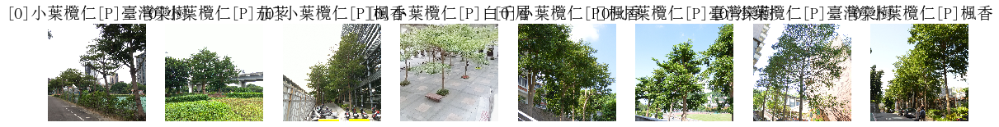

In [64]:
idx = np.where(Y_pred != np.argmax(Y_test, axis=1))[0]
false_img = X_test[idx]
false_answer = np.argmax(Y_test, axis=1)[idx]
false_pre = Y_pred[idx]

width = 8
height = len(false_img) // width + 1# // 取商
plt.figure(figsize=(20,8))
for i, img in enumerate(false_img):
    plt.subplot(height, width, i+1)
    t = f'[O]{SPECIES[CAT[false_answer[i]]]}[P]{SPECIES[CAT[false_pre[i]]]}'
    plt.title(t, fontproperties='SimSun', fontsize=20)
    plt.axis('off')
    plt.imshow(img)

In [141]:
model_chk = load_model('model/wtit-tree-cnn-cat7_448-ep071-valacc0.539-0.4357.h5')
cm, Y_pred = evaluate(model_chk, X_test, Y_test)
cm

accuracy: 0.4357, loss: 6.91137


,[P]小葉欖仁:0.316,[P]榕樹:0.538,[P]臺灣欒樹:0.625,[P]樟樹:0.667,[P]茄苳:0.571,[P]楓香:0.4,[P]白千層:0.347
[T]小葉欖仁:0.3,6,1,1,1,2,4,5
[T]榕樹:0.35,2,7,0,2,2,1,6
[T]臺灣欒樹:0.25,1,1,5,0,0,6,7
[T]樟樹:0.4,4,1,1,8,1,0,5
[T]茄苳:0.4,2,2,1,1,8,3,3
[T]楓香:0.5,4,0,0,0,0,10,6
[T]白千層:0.85,0,1,0,0,1,1,17


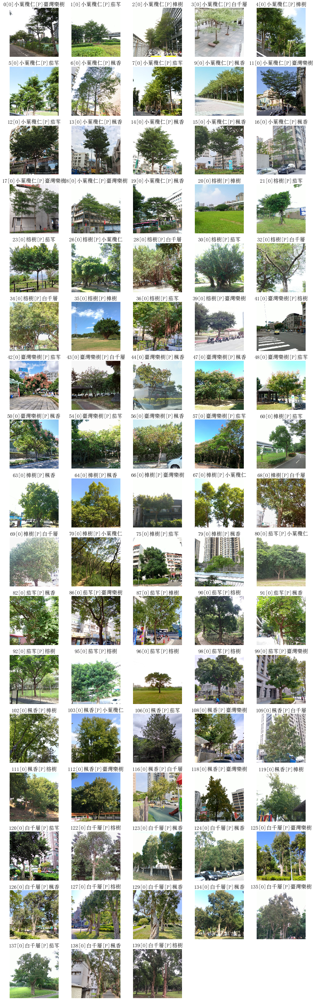

In [130]:
idx = np.where(Y_pred != np.argmax(Y_test, axis=1))[0]
false_img = X_test[idx]
false_answer = np.argmax(Y_test, axis=1)[idx]
false_pre = Y_pred[idx]

width = 5
height = len(false_img) // width + 1# // 取商
plt.figure(figsize=(20,4*height))
for i, img in enumerate(false_img):
    plt.subplot(height, width, i+1)
    t = f'{idx[i]}[O]{SPECIES[CAT[false_answer[i]]]}[P]{SPECIES[CAT[false_pre[i]]]}'
    plt.title(t, fontproperties='SimSun', fontsize=20)
    plt.axis('off')
    plt.imshow(img)

In [120]:
print(model_chk.predict(np.expand_dims(X_test[0], axis=0))[0])
print(CAT)

[1.7815162e-01 6.6766009e-04 1.5397096e-02 1.0628424e-05 8.0359620e-01
 2.0918222e-03 8.4949133e-05]
['TM', 'FM', 'KE', 'CC', 'BJ', 'LF', 'MI']


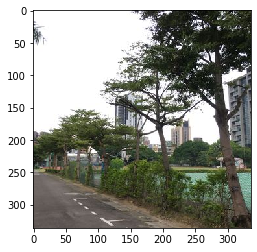

In [121]:
plt.imshow(X_test[0])

In [122]:
Y_pred[0]

4

In [116]:
idx

array([  1,   3,   5,   6,   7,   9,  12,  13,  15,  16,  17,  19,  20,
        21,  23,  30,  32,  34,  35,  39,  41,  42,  43,  44,  47,  50,
        52,  54,  55,  56,  59,  60,  61,  64,  65,  66,  67,  68,  69,
        70,  72,  74,  75,  76,  78,  79,  82,  86,  87,  89,  91,  92,
        93,  96,  98,  99, 100, 101, 103, 106, 107, 109, 111, 112, 115,
       116, 117, 119, 120, 121, 122, 123, 125, 126, 127, 128, 129, 130,
       131, 134, 139], dtype=int64)

In [98]:
a = model.predict(np.expand_dims(X_test[1], axis=0))
print(a[0], '\n', CAT)

[0.17250778 0.08359095 0.1760706  0.15785065 0.14721853 0.19096226
 0.07179931] 
 ['TM', 'FM', 'KE', 'CC', 'BJ', 'LF', 'MI']


In [101]:
Y_test[1]

array([1., 0., 0., 0., 0., 0., 0.])

TM
BJ


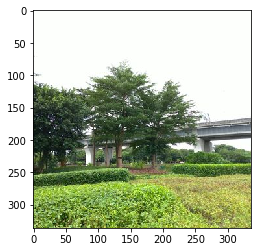

In [58]:
plt.imshow(X_test[1])
print(CAT[np.argmax(Y_test[1])])
print(CAT[Y_pred[1]])

## Just Infrerence

In [8]:
model_std = load_model('model_ensemble/wtit-tree-cnn-cat7-ep161-acc0.493.h5')
model_ca2 = load_model('model_ensemble/wtit-tree-cnn-ca2-cat7-ep136-acc0.521.h5')
model_sc2 = load_model('model_ensemble/wtit-tree-cacnn-cat7-stdca2-ep137-acc0.529.h5')

In [9]:
Y_pred_std = model_std.predict(X_test)
Y_pred_ca2 = model_ca2.predict(X_test_ca2)
Y_pred_sc2 = model_sc2.predict([X_test, X_test_ca2])
Y_pred_ens = Y_pred_std * 0.4 + Y_pred_ca2 * 0.6

In [53]:
model_chk = load_model('model_ensemble/wtit-tree-cnn-cat7-ep161-acc0.493.h5')
cm, Y_pred = evaluate(model_chk, X_test, Y_test)
cm

accuracy: 0.4857, loss: 6.25525


,[P]小葉欖仁:0.545,[P]榕樹:0.591,[P]臺灣欒樹:0.65,[P]樟樹:0.412,[P]茄苳:0.333,[P]楓香:0.387,[P]白千層:0.524
[T]小葉欖仁:0.3,6,0,2,3,2,4,3
[T]榕樹:0.65,0,13,0,1,3,2,1
[T]臺灣欒樹:0.65,1,0,13,0,2,3,1
[T]樟樹:0.35,2,0,1,7,2,5,3
[T]茄苳:0.3,2,6,2,2,6,2,0
[T]楓香:0.6,0,1,2,3,0,12,2
[T]白千層:0.55,0,2,0,1,3,3,11


TM
[9.6155703e-01 4.7803231e-05 1.3740355e-04 8.5728016e-04 1.4750186e-05
 3.7344176e-02 4.1533272e-05] 0 TM
[3.3344645e-02 6.2057789e-11 3.2722089e-13 6.5212319e-17 1.9723438e-09
 9.6665531e-01 2.6558952e-14] 5 LF
[4.0462959e-01 1.9121329e-05 5.4961420e-05 3.4291207e-04 5.9012577e-06
 5.9493089e-01 1.6613309e-05] 5 LF


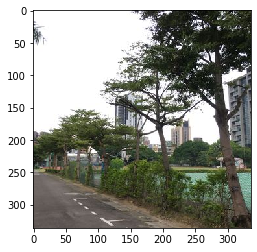

In [29]:
idx = 0
print(CAT[np.argmax(Y_test[idx])])
plt.imshow(X_test[idx])
print(Y_pred_std[idx], np.argmax(Y_pred_std[idx]), CAT[np.argmax(Y_pred_std[idx])])
print(Y_pred_ca2[idx], np.argmax(Y_pred_ca2[idx]), CAT[np.argmax(Y_pred_ca2[idx])])
print(Y_pred_ens[idx], np.argmax(Y_pred_ens[idx]), CAT[np.argmax(Y_pred_ens[idx])])

In [10]:
import pandas as pd
cm_std = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(Y_pred_std, axis=1))
print(pd.DataFrame(cm_std, columns=CAT, index=CAT), f'STD ACC: {np.trace(cm_std)/len(Y_test):.3f}\n')
cm_ca2 = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(Y_pred_ca2, axis=1))
print(pd.DataFrame(cm_ca2, columns=CAT, index=CAT), f'CA2 ACC: {np.trace(cm_ca2)/len(Y_test):.3f}\n')
cm_ens = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(Y_pred_ens, axis=1))
print(pd.DataFrame(cm_ens, columns=CAT, index=CAT), f'ENS ACC: {np.trace(cm_ens)/len(Y_test):.3f}\n')
cm_sc2 = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(Y_pred_sc2, axis=1))
print(pd.DataFrame(cm_sc2, columns=CAT, index=CAT), f'SC2 ACC: {np.trace(cm_sc2)/len(Y_test):.3f}')

    TM  FM  KE  CC  BJ  LF  MI
TM   6   0   2   3   2   4   3
FM   0  13   0   1   3   2   1
KE   1   0  13   0   2   3   1
CC   2   0   1   7   2   5   3
BJ   2   6   2   2   6   2   0
LF   0   1   2   3   0  12   2
MI   0   2   0   1   3   3  11 STD ACC: 0.486

    TM  FM  KE  CC  BJ  LF  MI
TM  16   1   0   0   1   1   1
FM   2   8   1   2   5   1   1
KE   1   1  12   0   2   2   2
CC   2   0   1   9   1   5   2
BJ   2   3   2   2   9   2   0
LF   0   2   3   0   0  13   2
MI   0   1   1   2   2   4  10 CA2 ACC: 0.550

    TM  FM  KE  CC  BJ  LF  MI
TM  15   1   0   0   1   1   2
FM   2   9   1   1   5   1   1
KE   1   1  12   0   2   2   2
CC   1   0   1   8   2   5   3
BJ   2   3   2   2   9   2   0
LF   0   2   1   0   0  15   2
MI   0   1   0   2   2   4  11 ENS ACC: 0.564

    TM  FM  KE  CC  BJ  LF  MI
TM  16   1   0   0   1   0   2
FM   3   6   2   2   3   1   3
KE   2   0  13   1   1   2   1
CC   4   1   2   9   0   3   1
BJ   2   4   3   2   8   1   0
LF   4   0   1   1   0

In [7]:
from sklearn.metrics import confusion_matrix
f = 0.4
Y_pred_ens = Y_pred_std * f + Y_pred_ca2 * (1-f)
ss = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(Y_pred_ens, axis=1), labels=None, sample_weight=None)

NameError: name 'Y_pred_std' is not defined

In [88]:
np.trace(ss) / len(Y_pred_ens)

0.5642857142857143

In [5]:
ss

NameError: name 'ss' is not defined